In [37]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
import tifffile as tiff
from tqdm import tqdm
import cv2
from skimage.metrics import structural_similarity as ssim
from IPython.display import display, Markdown
import pywt
import re

In [ ]:
def load_rgba_channels(path):
        img = tiff.imread(path)
        if img.ndim == 3 and img.shape[0] == 4:
            img = np.moveaxis(img, 0, -1)
        elif img.ndim != 3 or img.shape[2] != 4:
            raise ValueError(f"Unexpected shape: {img.shape}")
        return [img[:, :, i] for i in range(4)]

def get_image_dimensions(frame_path):
    """
    Get the dimensions of the image at the specified path.
    
    Parameters:
    - frame_path (Path): Path to the image file.
    
    Returns:
    - tuple: (height, width) of the image.
    """
    with Image.open(frame_path) as img:
        return img.size  # Returns (width, height)

def load_all_frames(tiff_folder_path, global_min, global_max, num_frames, stim):
    channel_labels = ['Red', 'Green', 'Blue', 'Alpha']

    tif_files = [f for f in os.listdir(tiff_folder_path) if f.endswith('.tif')]
    tif_files = sorted(tif_files, key=lambda x: int(x.split('.')[0]))

    # print(tif_files, "\n") 
    # Limit the frames to load based on start_frame_idx and num_frames
    if stim == 1:
        start_frame_idx = 37
        ref_frame_idx = 3
        end_frame_idx = 2
    elif stim == 2:
        start_frame_idx = 98
        ref_frame_idx = 2
        end_frame_idx = 3
    elif stim == 3:
        start_frame_idx = 159
        ref_frame_idx = 1
        end_frame_idx = 4
    elif stim == 4:
        start_frame_idx = 219
        ref_frame_idx = 4
        end_frame_idx = 1
    elif stim == 5:
        start_frame_idx = 280
        ref_frame_idx = 3
        end_frame_idx = 1
    
    else:
        start_frame_idx = None
        raise ValueError(f"Unknown stimulation type: {stim}")

    tif_files = tif_files[start_frame_idx:start_frame_idx + num_frames]
    # for i in tif_files:
    #     print(i)
    
    
    mean_values = []
    frame_refs = []
    channel_means = [[] for _ in range(4)]  # One list per channel

    channel_stored = []

    """Process each TIFF file, compute global min/max, and store mean values
        channel_stored is a list of 4 lists, each containing the frames for that channel i.e.
        channel_stored[0] contains all red channel frames, 
        channel_stored[1] contains all green channel frames, etc. --> let's create DEFINE for this

        This means that to read the frames in the correct order, we should proceed:
        take channel_stored[0][0] then channel_stored[1][0], channel_stored[2][0], channel_stored[3][0]
        then channel_stored[0][1], channel_stored[1][1], channel_stored[2][1], channel_stored[3][1] and so on

        See function get_channel_idx_from_frame_number(frame_number) for more details
    """

    for tif_file in tqdm(tif_files, desc="Processing frames"):
        # print(f"Processing file: {tif_file}")
        path = os.path.join(tiff_folder_path, tif_file)
        channels = load_rgba_channels(path) # 2048 x 2048 x 4

        for i, ch in enumerate(channels):
            global_min = min(global_min, np.min(ch))
            global_max = max(global_max, np.max(ch))

            mean_val = np.mean(ch)
            mean_values.append(mean_val)
            frame_refs.append((tif_file, channel_labels[i]))  # e.g., ('frame_001.tif', 'G')

            channel_means[i].append(np.mean(channels[i])) # Store mean intensity for each channel
            # Concatenate channels for the current frame in the order R, G, B, A
            channel_stored.append(ch)

    # print(f"✅ Global min: {global_min}")
    # print(f"✅ Global max: {global_max}")

    return channel_stored, channel_means, mean_values, global_min, global_max, ref_frame_idx, end_frame_idx

def convert_16bit_to_8bit(frame, global_min, global_max, local):
    """
    Converts a 16-bit frame to 8-bit by scaling the pixel values based on
    the provided global min and max values.

    Parameters:
    - frame (numpy array): The input 16-bit image (H, W) or (H, W, C).
    - global_min (int): The global minimum value for scaling.
    - global_max (int): The global maximum value for scaling.

    Returns:
    - numpy array: The scaled 8-bit image.
    """
    # Scale the frame to 8-bit using the provided global min and max
    if local:
        local_max = np.max(frame)
        local_min = np.min(frame)
        scaled_frame = ((frame - local_min) * 255.0 / (local_max - local_min)).astype(np.uint8)
        return scaled_frame

    else:
        scaled_frame = ((frame - global_min) * 255.0 / (global_max - global_min)).astype(np.uint8)
        return scaled_frame

def crop_frame_ROIS_resize_box_height_and_width(frame, global_min, global_max, local, show):
    
    frame_8bit = convert_16bit_to_8bit(frame, global_min, global_max, local)
    # Step 2: Thresholding (Adaptive Thresholding or Otsu's method)
    _, thresh = cv2.threshold(frame_8bit, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Step 3: Find contours
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    # Step 4: Filter contours by area (keep only the largest 3)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:3]

    # Step 5: Create masks and extract ROIs for each detected contour
    rois = []
    roi_coordinates = []

    # Find the height of the largest ROI
    max_height = 0
    max_width = 0
    for contour in contours:
        # Get bounding box of the contour
        x, y, w, h = cv2.boundingRect(contour)
        max_height = max(max_height, h)
        max_width = max(max_width, w)
    # print(f"Max height: {max_height}, Max width: {max_width}")

    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)

        # If the ROI is smaller than the max height or width, we need to resize
        scale_factor_height = max_height / h
        scale_factor_width = max_width / w
        
        # Resize the ROI while maintaining aspect ratio for both height and width
        new_width = int(w * scale_factor_width)
        new_height = int(h * scale_factor_height)
        
        # Calculate the new bounding box to keep the ROI centered
        new_x = x - (new_width - w) // 2  # Adjust x to keep the ROI centered
        new_y = y - (new_height - h) // 2  # Adjust y to keep the ROI centered

        # Debug: Print the calculated coordinates before cropping
        #print(f"New coordinates: new_x={new_x}, new_y={new_y}, new_width={new_width}, new_height={new_height}")

        # # Clip the coordinates to make sure they don't go out of bounds
        # new_x = max(new_x, 0)  # Ensure x is not negative
        # new_y = max(new_y, 0)  # Ensure y is not negative
        # new_width = min(new_width, frame.shape[1] - new_x)  # Ensure the width is within bounds
        # new_height = min(new_height, frame.shape[0] - new_y)  # Ensure the height is within bounds
        # #print(f"Clipped coordinates: new_x={new_x}, new_y={new_y}, new_width={new_width}, new_height={new_height}")

        # Check if the calculated coordinates are within bounds
        if new_x < 0 or new_y < 0 or new_x + new_width > frame.shape[1] or new_y + new_height > frame.shape[0]:
            print("Warning: Invalid ROI coordinates. Skipping this ROI.")
            continue
    
    
        # Crop and resize the ROI from the original image
        resized_roi = frame[new_y:new_y + new_height, new_x:new_x + new_width]

        # Debug: Check ROI shapes after resizing
        #print(f"Resized ROI shape: {resized_roi.shape}")

        # If the resized ROI doesn't match max_height and max_width exactly, pad it
        # Padding on top, bottom, left, and right if necessary
        pad_top = (max_height - new_height) // 2
        pad_bottom = max_height - new_height - pad_top  # Adjust padding to match total height
        pad_left = (max_width - new_width) // 2
        pad_right = max_width - new_width - pad_left  # Adjust padding to match total width
        #print(f"Padding: Top: {pad_top}, Bottom: {pad_bottom}, Left: {pad_left}, Right: {pad_right}")


        # Add padding to the resized ROI to make it match the max height and width
        padded_roi = cv2.copyMakeBorder(
            resized_roi, pad_top, pad_bottom, pad_left, pad_right, 
            cv2.BORDER_CONSTANT, value=(0, 0, 0)
        )
        # print(f"Resized ROI shape: {resized_roi.shape}")
        # print(f"Padded ROI shape: {padded_roi.shape}")

        rois.append(padded_roi)


        # Adjust the coordinates to reflect the new padded dimensions
        # Adjusting `x` and `y` based on the padding applied
        new_roi_coordinates = (new_x + pad_left, new_y + pad_top, max_width, max_height)
        roi_coordinates.append(new_roi_coordinates)

        # Draw bounding box for visualization
        cv2.rectangle(frame_8bit, (new_x + pad_left, new_y + pad_top), 
                      (new_x + pad_left + max_width, new_y + pad_top + max_height), 
                      (0, 255, 0), 2)

    # Step 6: Display the results
    if show:
        plt.figure(figsize=(10, 5))

        # Original image with detected contours
        plt.subplot(1, 4, 1)
        plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        plt.title("Original Image with Contours")
        plt.axis('off')

        # Cropped ROI images
        for i, roi in enumerate(rois):
            # print(f"Shape roi {i} : {roi.shape}\n")
            plt.subplot(1, 4, i+2)
            plt.imshow(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB))
            plt.title(f"ROI {i+1}")
            plt.axis('off')

        plt.show()

    return rois, roi_coordinates, frame_8bit

def apply_roi_to_frame(frame, roi_coordinates):
    #frame_8bit = convert_16bit_to_8bit(frame, global_min, global_max, local)
    """
    Apply the stored ROI coordinates to extract the same part of another frame.
    """
    x, y, w, h = roi_coordinates
    roi = frame[y:y+h, x:x+w]
    return roi

def combine_rois(rois):
    """
    Concatenate the ROIs horizontally based on the custom order. 
    No resizing needed as the images have the same height.
    
    :param rois: List of ROIs (images).
    :param order: List specifying the order of the ROIs (default is None which uses the input order).
    :return: Combined image with ROIs in the specified order.
    """
    BOTTOM = 0
    RIGHT = 1
    LEFT = 2
    order = [LEFT,BOTTOM,RIGHT]
    #print(f"shape of rois: {len(rois)}, {rois[0].shape}")
    # Rearrange the ROIs according to the custom order
    ordered_rois = [rois[i] for i in order]
    
    # Concatenate the images horizontally (side by side)
    combined_image = np.hstack(ordered_rois)
    
    return combined_image

def compute_difference(frame_ref, frame_current, roi_coordinates):
    """
    Compute the difference between the reference frame and current frame.
    """
    # Apply ROI and resize the frames
    roi_ref = apply_roi_to_frame(frame_ref, roi_coordinates)
    roi_current = apply_roi_to_frame(frame_current, roi_coordinates)
    
    # Resize and combine the ROIs
    combined_ref = combine_rois([roi_ref])
    combined_current = combine_rois([roi_current])
    
    # Compute the absolute difference between the combined reference and current frames
    diff = np.abs(combined_ref.astype(np.int16) - combined_current.astype(np.int16))
    
    return diff

def center_crop_square(img, crop_size, offset_x, offset_y):
    """
    Crop a square of size crop_size x crop_size from the image with optional offset.

    Parameters:
    - img: Input image (H x W x C) or (H x W)
    - crop_size: Size of the square to crop
    - offset_x: Horizontal offset from the center (+ right, - left)
    - offset_y: Vertical offset from the center (+ down, - up)

    Returns:
    - cropped_img: Cropped square image
    """
    h, w = img.shape[:2]

    if crop_size > h or crop_size > w:
        raise ValueError(f"crop_size ({crop_size}) is larger than image dimensions ({h}x{w})")

    # Compute top-left corner of the crop based on center and offset
    start_x = (w - crop_size) // 2 + offset_x
    start_y = (h - crop_size) // 2 + offset_y

    # Make sure coordinates are within image bounds
    start_x = max(0, min(start_x, w - crop_size))
    start_y = max(0, min(start_y, h - crop_size))

    cropped_img = img[start_y:start_y + crop_size, start_x:start_x + crop_size]

    return cropped_img

def analyze_stimulation_period(reference_frame, global_min, global_max, num_frames, stored_frames, square, crop_size, offset_x, offset_y, show, threshold, view='all'):
    """
    Analyze the difference between the reference frame and subsequent frames during the stimulation period.
    """
    differences = []  # List to store differences between frames
    scores = []
    ssim_maps = []
    diffs_thresh = []
    # Step 1: Get the reference combined frame (resize and combine)
    if square:
        combined_ref = center_crop_square(reference_frame, crop_size, offset_x, offset_y)
    else:
        # Crop the reference frame into ROIs and combine them based on the specified view
        rois_ref , roi_coord, _ = crop_frame_ROIS_resize_box_height_and_width(reference_frame, global_min, global_max, local=False, show=show)
        #combined_ref = combine_rois(rois_ref)
        if view == 'all':
            combined_ref = combine_rois(rois_ref)
        elif view == 'bottom':
            combined_ref = rois_ref[0]
        elif view == 'right':
            combined_ref = rois_ref[1]
        elif view == 'left':
            combined_ref = rois_ref[2]
        elif view == 'bot_left':
            combined_ref = np.hstack((rois_ref[0], rois_ref[2]))
        elif view == 'bot_right':
            combined_ref = np.hstack((rois_ref[0], rois_ref[1]))
        else:
            raise ValueError("Invalid view option. Choose from 'all', 'bottom', 'right', or 'left'.")
        
    print(f"Combined reference frame shape: {combined_ref.shape}")
    # Step 2: Loop over the stimulation period frames
    for i in range(0, num_frames):
        # Get the channel and index for the current frame in the stimulation period
        frame_current = stored_frames[i]
        if square:
            combined_current_frame = center_crop_square(frame_current, crop_size, offset_x, offset_y)
            
        else:
            # Crop the current frame into ROIs and combine them based on the specified view
            rois_current_frame = [apply_roi_to_frame(frame_current, coord) for coord in roi_coord]

            if view == 'all':
                combined_current_frame = combine_rois(rois_current_frame)
            elif view == 'bottom':
                combined_current_frame = rois_current_frame[0]
            elif view == 'right':
                combined_current_frame = rois_current_frame[1]
            elif view == 'left':
                combined_current_frame = rois_current_frame[2]
            elif view == 'bot_left':
                combined_current_frame = np.hstack((rois_current_frame[0], rois_current_frame[2]))
            elif view == 'bot_right':
                combined_current_frame = np.hstack((rois_current_frame[0], rois_current_frame[1]))
            else:
                raise ValueError("Invalid view option. Choose from 'all', 'bottom', 'right', or 'left'.")
                
        # Step 3: Compute the difference between the reference and current frame
        diff = np.abs(combined_ref.astype(np.int16) - combined_current_frame.astype(np.int16))
        score, ssim_map = ssim(combined_ref, combined_current_frame, full=True, data_range=combined_ref.max() - combined_ref.min())
        # Compute the absolute difference

        
        # Threshold the difference to highlight significant differences
        _, diff_thresh = cv2.threshold(diff, threshold, global_max, cv2.THRESH_BINARY)
    


        # Store the difference in the array
        differences.append(diff)
        scores.append(score)
        ssim_maps.append(ssim_map)
        diffs_thresh.append(diff_thresh)

    # Return the array of differences
    return np.array(differences), np.array(scores), np.array(ssim_maps), np.array(diffs_thresh)

def median_heatmap(images):
    if len(images) < 3:
        raise ValueError("Need at least 3 images to drop first/last.")
    stack = np.stack(images[1:-1], axis=0)  # exclude first and last
    med = np.median(stack, axis=0)
    # keep 8-bit output
    return med.astype(np.uint8)

def mean_heatmap(images):
    stack = np.stack(images[1:-1], axis=0)  # exclude first and last
    mean = np.mean(stack, axis=0)
    # keep 8-bit output
    return mean.astype(np.uint8)

def bin_heatmap(images, bin_size=8, percentage=15):
    bin_h, bin_w = bin_size, bin_size     # bin size (hyperparam)

    pix_thresh   = np.round(bin_h * bin_w * percentage / 100)

    print(f"{bin_h}x{bin_w} bins, pixel threshold: {int(pix_thresh)} pixels ({percentage}%)")

    # 1) stack and binarize
    stack = np.stack(images, 0)   # shape (N,H,W)
    stack = (stack > 0).astype(np.uint8)

    N, H, W = stack.shape

    # 2) crop to multiples of bin size
    Hc, Wc = (H // bin_h) * bin_h, (W // bin_w) * bin_w
    stack = stack[:, :Hc, :Wc]

    # 3) sum pixels inside each bin
    nbh, nbw = Hc // bin_h, Wc // bin_w
    bin_counts = stack.reshape(N, nbh, bin_h, nbw, bin_w).sum(axis=(2,4))   # (N, nbh, nbw)

    # 4) threshold → bin active if ≥ pix_thresh pixels are on
    bin_active = (bin_counts >= pix_thresh).astype(np.uint8)

    # 5) frequency of active bins across images
    freq = bin_active.mean(axis=0)   # shape (nbh, nbw), values in [0,1]

    return freq


def heatmap_generation(fly_dir, square, offset_x, offset_y, threshold=None, save=False, bin=1, percentage=100):
    ### parse the file path
    pat = re.compile(r'^(\d+)_lux_(\d+)$')
    folders = [f for f in os.listdir(fly_dir) if os.path.isdir(os.path.join(fly_dir,f))]
    folders = [f for f in folders if pat.match(f)]
    print(f"Found folders: {folders}")


    tiff_file_path = ...
    # init global min and max values
    global_min = np.inf
    global_max = -np.inf
    nb_frames = 16

    freq_list = []
    median_list = []
    mean_list = []

    for folder in folders:
        trial, intensity = map(int, pat.match(folder).groups())

        print(f"Processing folder: {folder} (Trial: {trial}, Intensity: {intensity})")
        tiff_file_path = Path(fly_dir) / folder

        if threshold is None:
            if intensity == 1023:
                threshold = 70
            elif intensity == 500:
                threshold = 50
            elif intensity == 200:
                threshold = 40

        for stim in range(2, 6):
            print(f"Processing stimulation {stim} with threshold {threshold}")
            
            # Load frames and compute global min/max
            stored_frames, frame_meas, mean_values, global_min, global_max, ref_frame_idx, end_frame_idx = load_all_frames(tiff_file_path, global_min, global_max, nb_frames, stim)
            num_frames = len(stored_frames)
            frame = stored_frames[ref_frame_idx-1]  # Reference frame for the stimulation period
            view = 'all'  # Options: 'all', 'bottom', 'right', 'left', 'bot_left', 'bot_right'
            crop_size = 1500


            # print("Before analyzing stimulation period:")
            differences, score, ssim_map, diff_thresh = analyze_stimulation_period(frame, global_min, global_max, num_frames, 
                                                                        stored_frames, square, crop_size, offset_x, offset_y,
                                                                        show=False, threshold=threshold, view=view)
            
            if save:
                output_path = tiff_file_path / f"diff_btw_ref_image_and_images_from_stim{stim}_thresh{threshold}.png" # change dir

                plt.figure(figsize=(15, 15))

                for i in range(num_frames):
                    plt.subplot(8, 8, i+1)
                    plt.imshow(diff_thresh[i], cmap='hot', vmin=0, vmax=255) 
                    if i - ref_frame_idx == 0:
                        plt.title(f"Reference Frame")
                    elif i - ref_frame_idx < 0:
                        plt.title(f"Before Stim {i - ref_frame_idx + 1}")
                    else:
                        plt.title(f"After Stim {i - ref_frame_idx}")

                    #plt.title(f"Diff {i+1}, SSIM: {score[i]:.4f}")
                    plt.axis('off')
                plt.savefig(output_path,dpi=300)
                plt.close()

            # stack = np.stack(differences[ref_frame_idx + 1:ref_frame_idx + 59], 0)        # shape (N,H,W)
            # stack = stack.astype(np.uint8)        # convert {0,255} -> {0,1}
            # counts = stack.sum(0)                       # pixel activation counts
            # freq   = counts / stack.shape[0]            # pixel activation frequency in [0,1]
            # freq_list.append(freq)

            # plt.figure(figsize=(6, 5))
            # plt.title(f"Activation frequency heatmap: {fly_dir.name}/{folder}")
            # im = plt.imshow(freq, cmap='afmhot')
            # plt.colorbar(im, fraction=0.046, pad=0.04, label="Frequency")
            # plt.axis("off")
            # plt.savefig(tiff_file_path / f"heatmap_stim{stim}_no_thresh.png", dpi=300)# change dir

            # bin_h, bin_w = bin, bin     # bin size (hyperparam)

            # pix_thresh   = np.round(bin_h * bin_w * percentage / 100)

            # print(f"{bin_h}x{bin_w} bins, pixel threshold: {int(pix_thresh)} pixels ({percentage}%)")

            # # 1) stack and binarize
            # stack = np.stack(diff_thresh[ref_frame_idx + 1:ref_frame_idx + 59], 0)   # shape (N,H,W)
            # stack = (stack > 0).astype(np.uint8)

            # N, H, W = stack.shape

            # # 2) crop to multiples of bin size
            # Hc, Wc = (H // bin_h) * bin_h, (W // bin_w) * bin_w
            # stack = stack[:, :Hc, :Wc]

            # # 3) sum pixels inside each bin
            # nbh, nbw = Hc // bin_h, Wc // bin_w
            # bin_counts = stack.reshape(N, nbh, bin_h, nbw, bin_w).sum(axis=(2,4))   # (N, nbh, nbw)

            # # 4) threshold → bin active if ≥ pix_thresh pixels are on
            # bin_active = (bin_counts >= pix_thresh).astype(np.uint8)

            # # 5) frequency of active bins across images
            # freq = bin_active.mean(axis=0)   # shape (nbh, nbw), values in [0,1]

            

            mean_img = mean_heatmap(diff_thresh[ref_frame_idx + 1:ref_frame_idx + 59])
            mean_list.append(mean_img)

            median_img = median_heatmap(diff_thresh[ref_frame_idx + 1:ref_frame_idx + 59])
            median_list.append(median_img)

            freq_img = bin_heatmap(diff_thresh[ref_frame_idx + 1:ref_frame_idx + 59], bin_size=bin, percentage=percentage)
            freq_list.append(freq_img)

            plt.figure(figsize=(15, 5))
            plt.suptitle(f"Heatmaps for fly {fly_dir.name}/{folder}")
            plt.subplot(1, 3, 1)
            im = plt.imshow(mean_img, cmap='afmhot')
            plt.title("Mean Heatmap of Differences")
            plt.colorbar(im, fraction=0.046, pad=0.04, label="Intensity")
            plt.axis("off")

            plt.subplot(1, 3, 2)
            im = plt.imshow(median_img, cmap='afmhot')
            plt.title("Median Heatmap of Differences")
            plt.colorbar(im, fraction=0.046, pad=0.04, label="Intensity")
            plt.axis("off")

            # Optional: expand bins back to image resolution for plotting
            freq_img = np.kron(freq_img, np.ones((bin, bin)))

            plt.subplot(1, 3, 3)
            plt.title(f"Activation frequency heatmap (bin={bin}x{bin},\n{percentage}%)")
            im = plt.imshow(freq_img, vmin=0, vmax=0.8, cmap='afmhot')
            plt.colorbar(im, fraction=0.046, pad=0.04, label="Frequency")
            plt.axis("off")

            plt.savefig(tiff_file_path / f"heatmap_stim{stim}_all_overlap.png", dpi=300)

    return freq_list, median_list, mean_list
        


Found folders: ['001_lux_1023', '006_lux_500', '002_lux_1023', '004_lux_1023', '005_lux_1023', '007_lux_500', '008_lux_200', '003_lux_1023', '009_lux_200', '010_lux_200']
Processing folder: 001_lux_1023 (Trial: 1, Intensity: 1023)
Processing stimulation 2 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:12<00:00,  1.31it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 3 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:10<00:00,  1.49it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 4 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:12<00:00,  1.30it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 5 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:12<00:00,  1.26it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing folder: 006_lux_500 (Trial: 6, Intensity: 500)
Processing stimulation 2 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:14<00:00,  1.12it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 3 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:10<00:00,  1.53it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 4 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:11<00:00,  1.45it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 5 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:11<00:00,  1.40it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing folder: 002_lux_1023 (Trial: 2, Intensity: 1023)
Processing stimulation 2 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:11<00:00,  1.36it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 3 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:12<00:00,  1.26it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 4 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:21<00:00,  1.35s/it]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 5 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:12<00:00,  1.30it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing folder: 004_lux_1023 (Trial: 4, Intensity: 1023)
Processing stimulation 2 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:13<00:00,  1.16it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 3 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:21<00:00,  1.33s/it]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 4 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:12<00:00,  1.31it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 5 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:12<00:00,  1.25it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing folder: 005_lux_1023 (Trial: 5, Intensity: 1023)
Processing stimulation 2 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:11<00:00,  1.41it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 3 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:11<00:00,  1.41it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 4 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:11<00:00,  1.39it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 5 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:11<00:00,  1.40it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing folder: 007_lux_500 (Trial: 7, Intensity: 500)
Processing stimulation 2 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:11<00:00,  1.45it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)


/tmp/ipykernel_627586/279601953.py:555: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(15, 5))


Processing stimulation 3 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:12<00:00,  1.27it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 4 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:17<00:00,  1.07s/it]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 5 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:11<00:00,  1.43it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing folder: 008_lux_200 (Trial: 8, Intensity: 200)
Processing stimulation 2 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:10<00:00,  1.53it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 3 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:17<00:00,  1.09s/it]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 4 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:15<00:00,  1.03it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 5 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:10<00:00,  1.58it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing folder: 003_lux_1023 (Trial: 3, Intensity: 1023)
Processing stimulation 2 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:11<00:00,  1.39it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 3 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:11<00:00,  1.45it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 4 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:10<00:00,  1.52it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 5 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:12<00:00,  1.33it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing folder: 009_lux_200 (Trial: 9, Intensity: 200)
Processing stimulation 2 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:11<00:00,  1.44it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 3 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:10<00:00,  1.52it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 4 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 5 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:09<00:00,  1.64it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing folder: 010_lux_200 (Trial: 10, Intensity: 200)
Processing stimulation 2 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:12<00:00,  1.23it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 3 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:10<00:00,  1.60it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 4 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:15<00:00,  1.05it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)
Processing stimulation 5 with threshold 70


Processing frames: 100%|██████████| 16/16 [00:10<00:00,  1.48it/s]


Combined reference frame shape: (1500, 1500)
8x8 bins, pixel threshold: 10 pixels (15%)


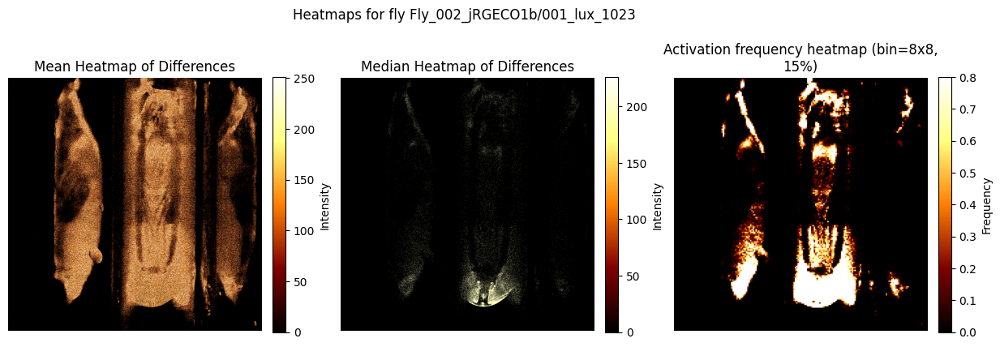

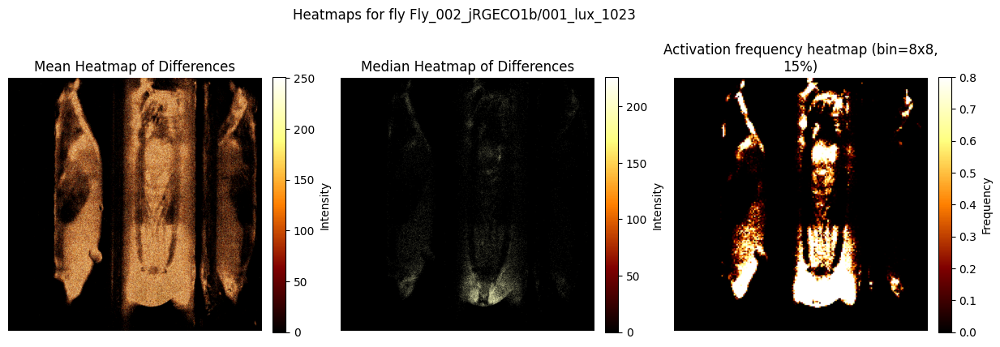

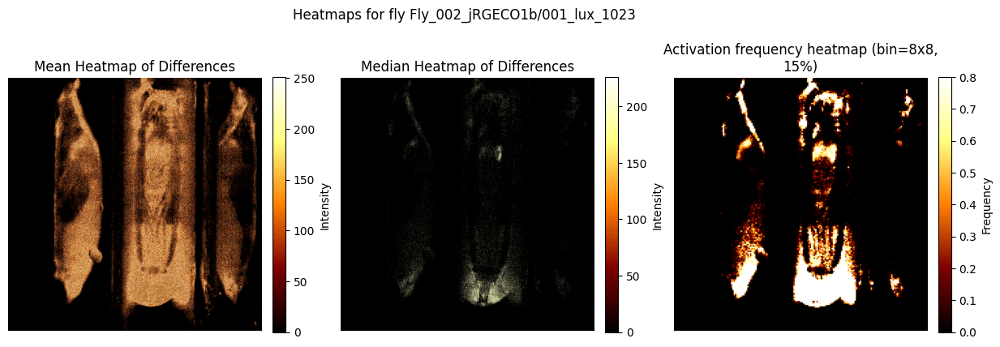

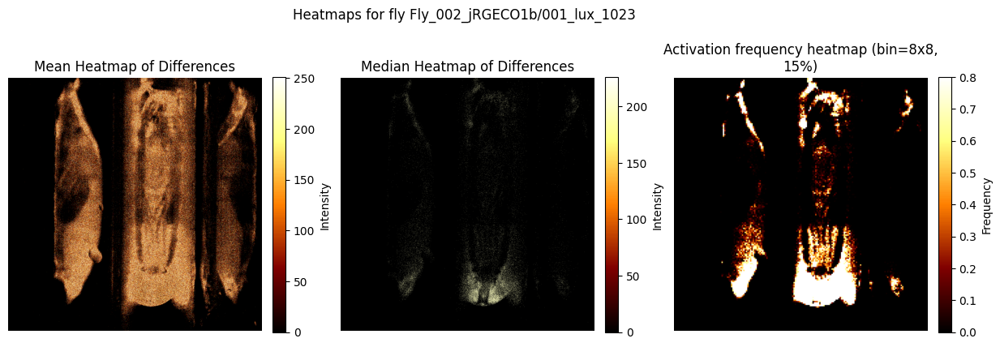

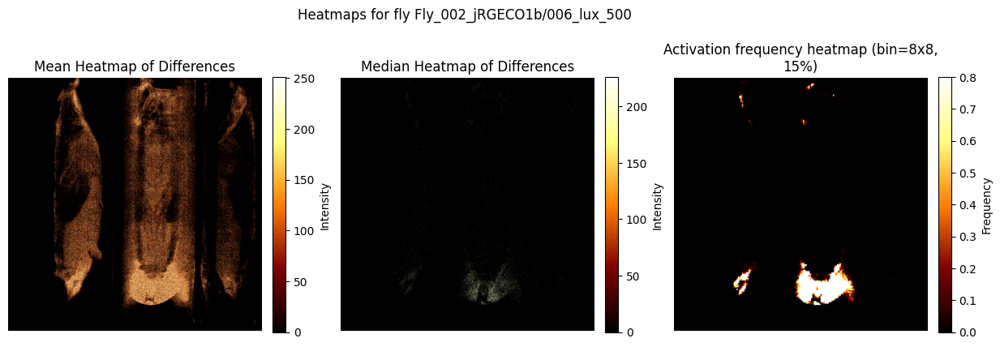

...

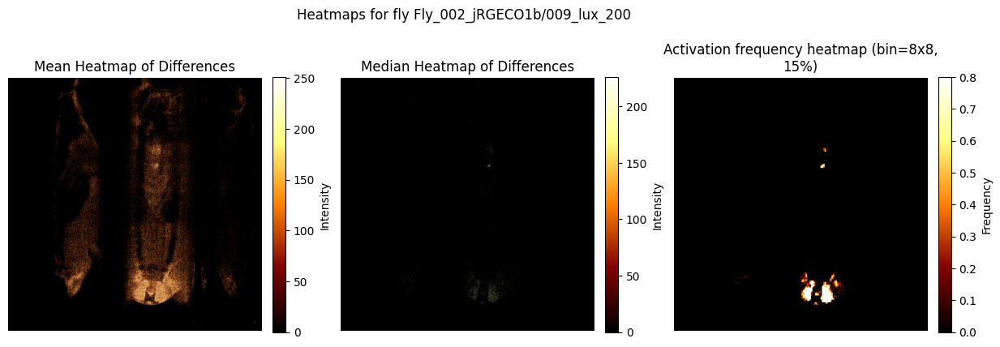

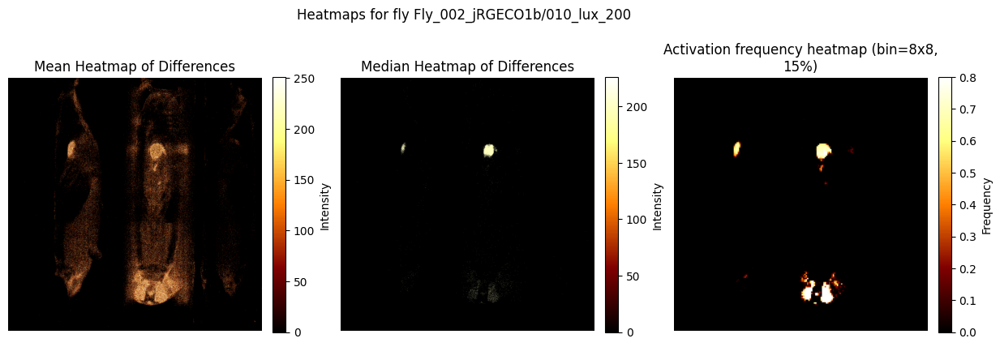

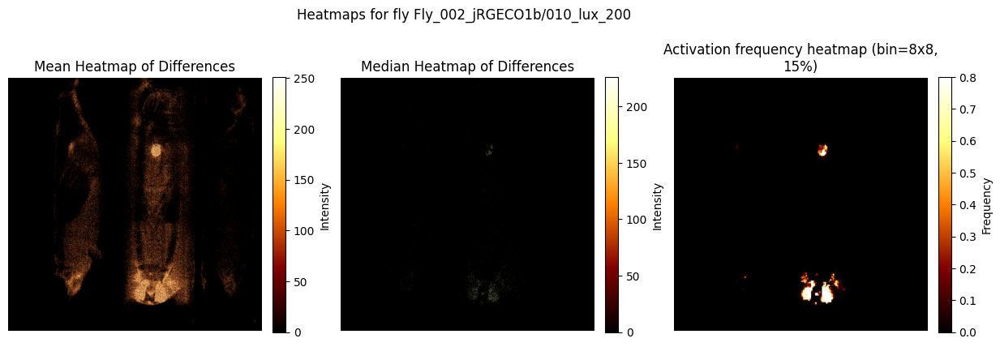

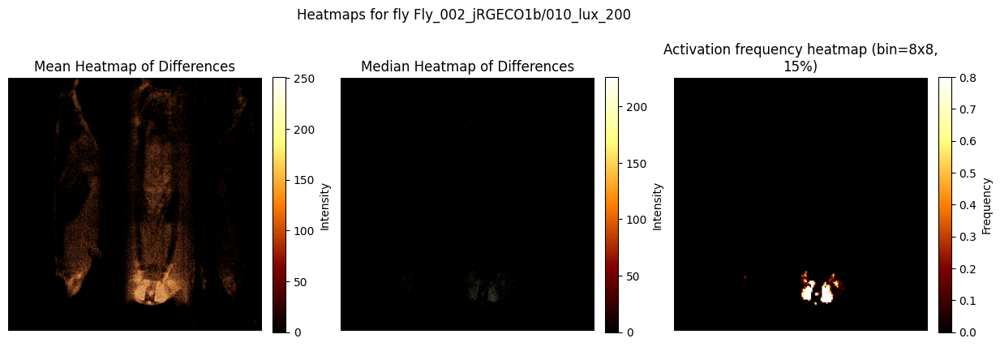

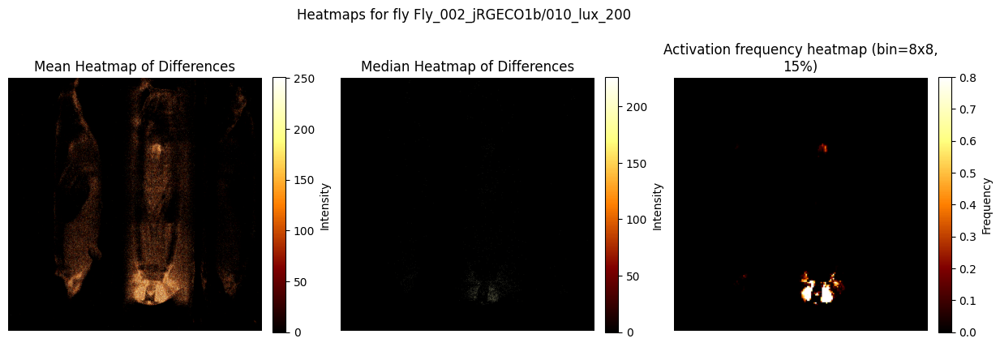

In [55]:
file_path = Path("/mnt/upramdya_data/LR/finaleExp_pupae/2025-07-14_finalExp_pupae/Fly_002_jRGECO1b")
square = True
offset_x = -80
offset_y = 30
freq_list, median_list, mean_list = heatmap_generation(file_path, square, offset_x, offset_y, 
                               threshold=None, save=False, bin=8, percentage=15)

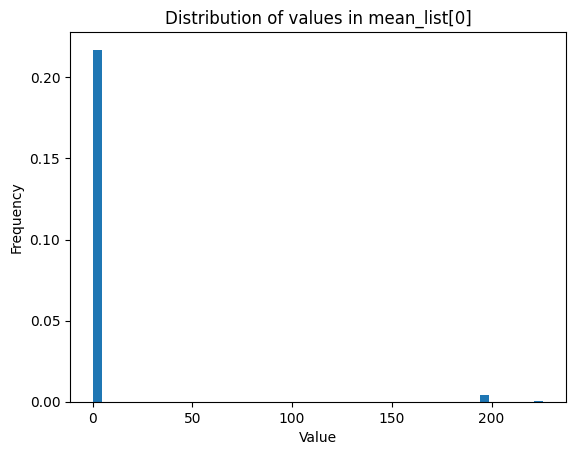

In [61]:
import numpy as np
import matplotlib.pyplot as plt

arr = median_list[0]  # 2D array

# Flatten to 1D
vals = arr.flatten()

# Histogram
plt.hist(vals, bins=50, density=True)  # density=True → probability distribution
plt.xlabel("Value")
plt.ylabel("Frequency")
plt.title("Distribution of values in mean_list[0]")
plt.show()


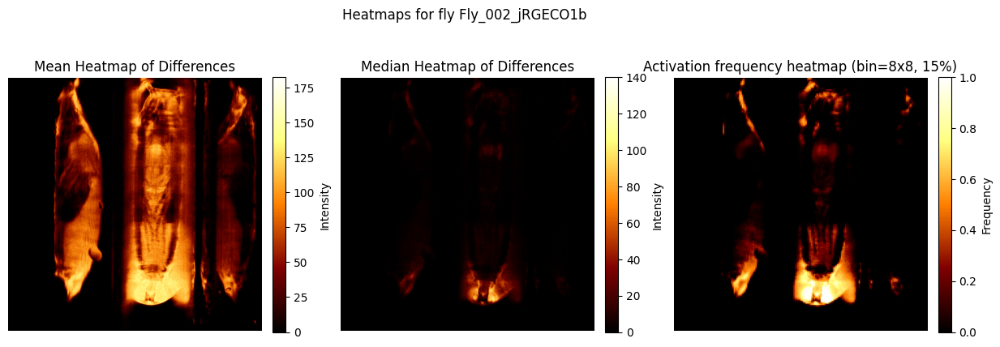

In [56]:
stack_mean = np.stack(mean_list, 0)        # shape (N,H,W)
mean = stack_mean.mean(0)                   # mean heatmap

stack_median = np.stack(median_list, 0)    # shape (N,H,W)
median = stack_median.mean(0)               # median heatmap

stack_freq = np.stack(freq_list, 0)        # shape (N,H,W)
counts_freq = stack_freq.sum(0)                       # pixel activation counts
freq   = counts_freq / stack_freq.shape[0]            # pixel activation frequency in [0,

plt.figure(figsize=(15, 5))
plt.suptitle(f"Heatmaps for fly {file_path.name}")

plt.subplot(1,3,1)
plt.title("Mean Heatmap of Differences")
im = plt.imshow(mean, cmap='afmhot')
plt.colorbar(im, fraction=0.046, pad=0.04, label="Intensity")
plt.axis("off") 

plt.subplot(1,3,2)
plt.title("Median Heatmap of Differences")
im = plt.imshow(median, cmap='afmhot')
plt.colorbar(im, fraction=0.046, pad=0.04, label="Intensity")
plt.axis("off")

plt.subplot(1,3,3)
plt.title(f"Activation frequency heatmap (bin=8x8, 15%)")
im = plt.imshow(freq, cmap='afmhot')
plt.colorbar(im, fraction=0.046, pad=0.04, label="Frequency")
plt.axis("off")

plt.savefig(file_path / "heatmap_final_all_ovelap.png", dpi=300)  # Save the heatmap
plt.show()

The following serves at overlapping the result heatmap image with a frame of the fly to visualize what illuminated part in the heatmap correspond to what part of the fly.

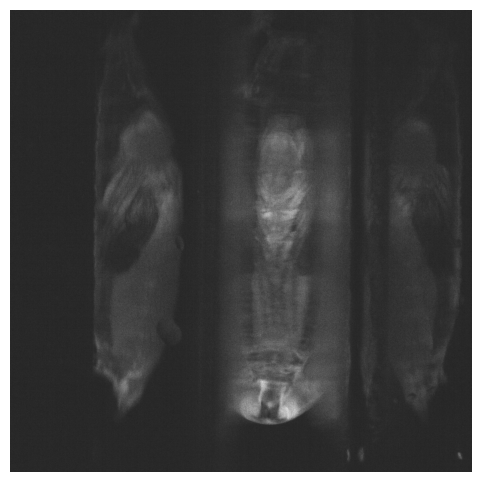

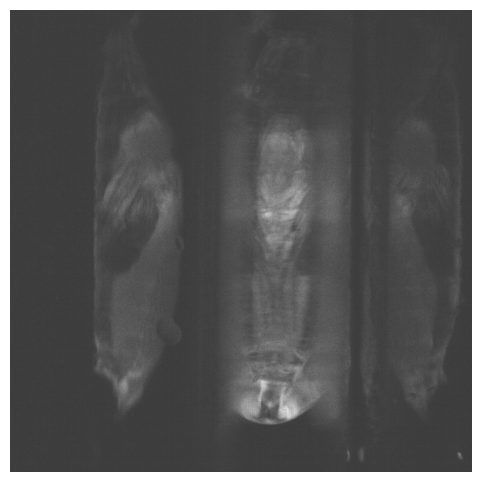

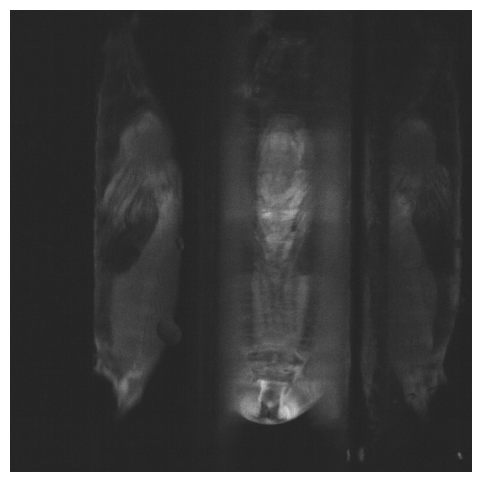

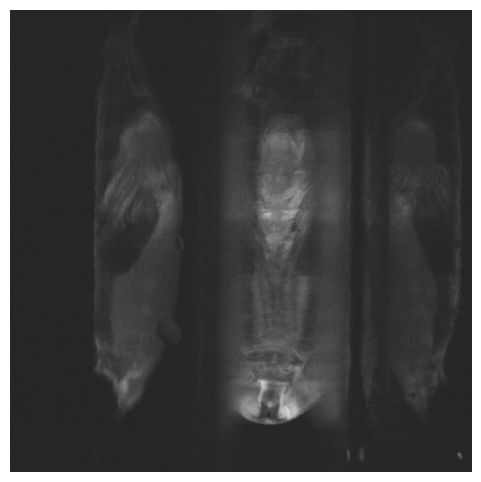

In [57]:
# init global min and max values
global_min = np.inf
global_max = -np.inf
nb_frames = 4
stim = 2

crop_size = 1500

tiff_folder_path = file_path / "002_lux_1023"
#stored_frames_overlap, _, _, global_min, global_max, ref_frame_idx, end_frame_idx = load_all_frames(tiff_folder_path, global_min, global_max, nb_frames, stim)
frame_path = tiff_folder_path / "145.tif"
channels = []
channel_stored_overlap = []
channels = load_rgba_channels(frame_path) # 2048 x 2048 x 4

for i, ch in enumerate(channels):
    global_min = min(global_min, np.min(ch))
    global_max = max(global_max, np.max(ch))
    crop = center_crop_square(ch, crop_size, offset_x, offset_y)
    #frame_refs.append((tif_file, channel_labels[i]))  # e.g., ('frame_001.tif', 'G')

    # Concatenate channels for the current frame in the order R, G, B, A
    channel_stored_overlap.append(crop)


# Display the loaded frames for verification
for i, frame in enumerate(channel_stored_overlap):
    frame_8bit = convert_16bit_to_8bit(frame, global_min, global_max, local=False)
    plt.figure(figsize=(6, 6))
    plt.imshow(frame_8bit, cmap='gray',)
    plt.axis('off')
    plt.show()

Try superimpose with contours finding instead

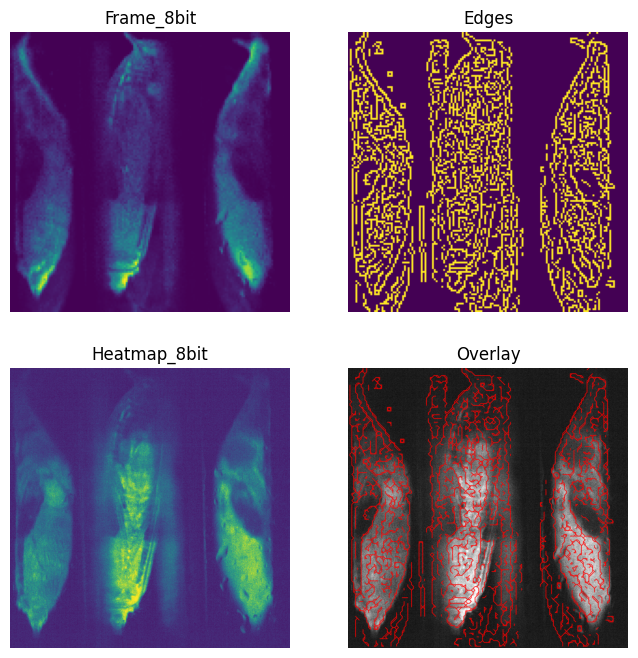

In [44]:
import cv2 as cv
H = channel_stored_overlap[0]
F = median
SCALE = 0.1

def to_u8(img, clip_prct=(0.5, 99.5)):
    """Convert uint16/float32/float64 to uint8 with percentile clipping (robust to outliers)."""
    if img.dtype == np.uint8:
        return img
    x = img.astype(np.float64)
    x = np.nan_to_num(x, nan=0.0, posinf=0.0, neginf=0.0)
    lo, hi = np.percentile(x, clip_prct)
    if hi <= lo:
        hi = lo + 1.0
    x = np.clip((x - lo) / (hi - lo), 0, 1)
    return (x * 255.0).astype(np.uint8)


# --- Force single-channel uint8 for processing ---
if F.ndim == 3: F = cv.cvtColor(F, cv.COLOR_BGR2GRAY)
if H.ndim == 3: H = cv.cvtColor(H, cv.COLOR_BGR2GRAY)
F8 = to_u8(F)       # your 16→8 conversion, but robust
H8 = to_u8(H)       # THIS fixes the CV_64F error

# ---------- downsample ----------
H0, W0 = F8.shape
Ws, Hs = int(round(W0 * SCALE)), int(round(H0 * SCALE))
assert Ws > 1 and Hs > 1, "Downsampled size too small; raise SCALE."

F8s = cv.resize(F8, (Ws, Hs), interpolation=cv.INTER_AREA)
H8s = cv.resize(H8, (Ws, Hs), interpolation=cv.INTER_AREA)

# --- Canny on the frame ---
m = np.median(F8s)
low, high = int(max(0, 0.66*m)), int(min(255, 1.33*m))
E = cv.Canny(F8s, low, high, L2gradient=True)

# --- Contours (requires 8-bit single-channel) ---
contours_s, hierarchy = cv.findContours(E, cv.RETR_TREE, cv.CHAIN_APPROX_NONE)

# ---------- scale contours back to full-res ----------
scale_back = 1.0 / SCALE
contours_full = []
for c in contours_s:
    c = c.reshape(-1, 2).astype(np.float32)
    c *= scale_back
    c = np.rint(c).astype(np.int32).reshape(-1, 1, 2)
    contours_full.append(c)

# --- Overlay on heatmap (promote to BGR for visible strokes) ---
Hc = cv.cvtColor(H8, cv.COLOR_GRAY2BGR)
cv.drawContours(Hc, contours_full, -1, (255,0,0),       2, lineType=cv.LINE_AA)  # halo
cv.drawContours(Hc, contours_full, -1, (255,0,0), 1, lineType=cv.LINE_AA)

# --- Display before saving ---
plt.figure(figsize=(8,8))
plt.subplot(2,2,1)
plt.imshow(F8s)
plt.axis("off")
plt.title("Frame_8bit")
plt.subplot(2,2,2)

plt.imshow(E)
plt.axis("off")
plt.title("Edges")
plt.subplot(2,2,3)

plt.imshow(H8)
plt.axis("off")
plt.title("Heatmap_8bit")
plt.subplot(2,2,4)

plt.imshow(Hc)
plt.axis("off")
plt.title("Overlay")

plt.show()


Try to threshold heatmap and superimpose it on the frame to see what part is shiny shiny

In [45]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import FloatSlider, IntSlider, Dropdown, ColorPicker, VBox, HBox, Output
from IPython.display import display, clear_output

# -------- helpers --------
def to_u8(x, clip=(0.5, 99.5)):
    if isinstance(x, np.ndarray) and x.dtype == np.uint8:
        return x
    xf = np.nan_to_num(np.asarray(x, dtype=np.float64))
    lo, hi = np.percentile(xf, clip)
    if hi <= lo: hi = lo + 1.0
    y = np.clip((xf - lo) / (hi - lo), 0, 1)
    return (y * 255).astype(np.uint8)

def apply_mpl_cmap(gray_u8, name='afmhot'):
    norm = gray_u8.astype(np.float32) / 255.0
    rgb  = (plt.get_cmap(name)(norm)[..., :3] * 255).astype(np.uint8)  # RGB
    return cv.cvtColor(rgb, cv.COLOR_RGB2BGR)  # -> BGR for cv math

def composite_with_mask(mask_u8, bot_gray_u8, alpha=0.5, cmap='afmhot', top_bgr=(0,0,255)):
    """Per-pixel alpha blend: out = (1-a)*bot + a*top, with a = alpha*(mask/255)."""
    bot_col = apply_mpl_cmap(bot_gray_u8, cmap)               # BGR
    top_col = np.empty_like(bot_col); top_col[:] = top_bgr    # solid color overlay
    a = (mask_u8.astype(np.float32) / 255.0) * float(alpha)   # HxW in [0,1]
    out = bot_col.astype(np.float32) * (1.0 - a)[...,None] + top_col.astype(np.float32) * a[...,None]
    return out.astype(np.uint8)

def hex_to_bgr(hexstr="#ff0000"):
    h = hexstr.lstrip("#")
    r,g,b = tuple(int(h[i:i+2],16) for i in (0,2,4))
    return (b,g,r)

# -------- your data --------
H = median                      # top image (will be thresholded -> mask)
F = channel_stored_overlap[0]   # background

H8, F8 = to_u8(H), to_u8(F)
assert H8.shape == F8.shape

# -------- widgets --------
alpha_slider = FloatSlider(description='Alpha', value=0.5, min=0.0, max=1.0, step=0.01, continuous_update=True)
thr_slider   = IntSlider(description='Thresh', value=10, min=0, max=255, step=1, continuous_update=True)
cmap_dd      = Dropdown(description='Colormap', options=['afmhot','magma','turbo','viridis','gray'], value='afmhot')
color_pick   = ColorPicker(description='Top color', value='#FF0000')  # red

out = Output()

def render():
    # threshold -> binary mask (black -> transparent)
    _, mask = cv.threshold(H8, int(thr_slider.value), 255, cv.THRESH_BINARY)
    top_bgr = hex_to_bgr(color_pick.value)
    over = composite_with_mask(mask, F8, alpha=alpha_slider.value, cmap=cmap_dd.value, top_bgr=top_bgr)
    with out:
        clear_output(wait=True)
        plt.figure(figsize=(6,6))
        plt.imshow(cv.cvtColor(over, cv.COLOR_BGR2RGB))
        plt.axis('off')
        plt.title(f'alpha={alpha_slider.value:.2f}, thr={int(thr_slider.value)}, cmap={cmap_dd.value}')
        plt.show()

# wire up
for w in (alpha_slider, thr_slider, cmap_dd, color_pick):
    w.observe(lambda _ : render(), names='value')

render()
display(VBox([out, HBox([alpha_slider, thr_slider, cmap_dd, color_pick])]))

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import FloatSlider, IntSlider, Dropdown, ColorPicker, VBox, HBox, Output
from IPython.display import display, clear_output

# ---------- helpers ----------
def to_u8(x, clip=(0.5, 99.5)):
    if isinstance(x, np.ndarray) and x.dtype == np.uint8:
        return x
    xf = np.nan_to_num(np.asarray(x, dtype=np.float64))
    lo, hi = np.percentile(xf, clip)
    if hi <= lo: hi = lo + 1.0
    y = np.clip((xf - lo) / (hi - lo), 0, 1)
    return (y * 255).astype(np.uint8)

def apply_mpl_cmap(gray_u8, name='afmhot'):
    norm = gray_u8.astype(np.float32) / 255.0
    rgb  = (plt.get_cmap(name)(norm)[..., :3] * 255).astype(np.uint8)  # RGB
    return cv.cvtColor(rgb, cv.COLOR_RGB2BGR)                          # -> BGR

def vertical_gennorm_weight(h, mu=0.5, alpha=0.15, beta=2.0, amp=1.0, base=0.0):
    """
    w(y) = base + amp * exp(-( |y-μ| / alpha )**beta), y in [0,1).
    Wider: increase alpha or decrease beta. Clipped to [0,1].
    """
    y = (np.arange(h) + 0.5) / float(h)
    w = base + amp * np.exp(- (np.abs(y - mu) / max(alpha,1e-9))**beta )
    return np.clip(w, 0.0, 1.0)[:, None]

def composite_with_mask(mask_u8, bot_gray_u8, alpha=0.5, cmap='afmhot',
                        top_bgr=(255, 0, 0), weight=None):
    bot_col = apply_mpl_cmap(bot_gray_u8, cmap)               # BGR
    top_col = np.empty_like(bot_col); top_col[:] = top_bgr
    a = (mask_u8.astype(np.float32) / 255.0)                  # HxW in [0,1]
    if weight is not None:
        a = a * weight                                        # HxW * Hx1
    a = np.clip(a * float(alpha), 0.0, 1.0)
    out = bot_col.astype(np.float32) * (1.0 - a)[..., None] + \
          top_col.astype(np.float32) * a[..., None]
    return out.astype(np.uint8)

def hex_to_bgr(hexstr="#ff0000"):
    h = hexstr.lstrip("#"); r,g,b = (int(h[i:i+2],16) for i in (0,2,4))
    return (b,g,r)

# ---------- data ----------
H = median
F = channel_stored_overlap[0]
H8, F8 = to_u8(H), to_u8(F)
assert H8.shape == F8.shape
Hh, Hw = H8.shape

# ---------- widgets ----------
alpha_slider = FloatSlider(description='Alpha',  value=1.0, min=0.0, max=1.0,  step=0.01, continuous_update=True)
thr_slider   = IntSlider(  description='Thresh', value=100, min=0,   max=255, step=1,    continuous_update=True)
cmap_dd      = Dropdown(   description='Colormap', options=['afmhot','magma','turbo','viridis','gray'], value='gray')
color_pick   = ColorPicker(description='Top color', value="#00FF0D")

mu_slider    = FloatSlider(description='μ (vert)', value=0.5,  min=0.0, max=1.0,   step=0.001, continuous_update=True)
alpha_scale  = FloatSlider(description='α (scale)', value=0.15, min=0.01, max=0.50, step=0.001, continuous_update=True)
beta_slider  = FloatSlider(description='β',        value=8.0,  min=0.0,  max=20.0, step=0.1,   continuous_update=True)
amp_slider   = FloatSlider(description='Amp',      value=1.0,  min=0.0,  max=1.0,  step=0.01,  continuous_update=True)
base_slider  = FloatSlider(description='Base',     value=0.0,  min=0.0,  max=1.0,  step=0.01,  continuous_update=True)

out = Output()

def render():
    # 1) threshold -> mask
    _, mask = cv.threshold(H8, int(thr_slider.value), 255, cv.THRESH_BINARY)
    # 2) vertical weights
    w = vertical_gennorm_weight(Hh,
                                mu=mu_slider.value,
                                alpha=alpha_scale.value,
                                beta=beta_slider.value,
                                amp=amp_slider.value,
                                base=base_slider.value)
    # 3) composite
    over = composite_with_mask(mask, F8,
                               alpha=alpha_slider.value,
                               cmap=cmap_dd.value,
                               top_bgr=hex_to_bgr(color_pick.value),
                               weight=w)

    # 4) single figure with two subplots
    with out:
        clear_output(wait=True)
        fig, (axL, axR) = plt.subplots(1, 2, figsize=(12, 6))
        plt.title('PDF to weight the fly muscle activity')
        # left: image
        axL.imshow(cv.cvtColor(over, cv.COLOR_BGR2RGB))
        axL.set_title('Highlighted muscle activity regions'); axL.axis('off')

        # right: distribution w(y)
        y = (np.arange(Hh) + 0.5) / float(Hh)
        w1d = w[:, 0]
        axR.plot(w1d, y, linewidth=2)
        axR.set_xlim(0, 1); axR.set_ylim(0, 1)
        axR.invert_yaxis()  # y=0 at top to match image visual
        axR.grid(True, alpha=0.3)
        axR.set_xlabel('Weight(Normalized)'); axR.set_ylabel('Image height (Normalized)')
        # reference line at μ
        axR.axhline(mu_slider.value, linestyle='--', linewidth=1)
        # FWHM (exponent-only) for intuition
        fwhm = 2.0 * alpha_scale.value * (np.log(2.0))**(1.0 / max(beta_slider.value, 1e-12))
        # fig.suptitle(f'α={alpha_slider.value:.2f}, thr={int(thr_slider.value)}, '
        #              f'μ={mu_slider.value:.3f}, α(scale)={alpha_scale.value:.3f}, '
        #              f'β={beta_slider.value:.3f}, FWHM≈{fwhm:.3f}, '
        #              f'amp={amp_slider.value:.2f}, base={base_slider.value:.2f}, '
        #              f'cmap={cmap_dd.value}',
                    #  y=0.98)
        fig.suptitle(f'Muscle activity on the fly\'s core')
        plt.tight_layout()
        plt.show()

def on_change(_): render()

for wdg in (alpha_slider, thr_slider, cmap_dd, color_pick,
            mu_slider, alpha_scale, beta_slider, amp_slider, base_slider):
    wdg.observe(on_change, names='value')

render()
display(VBox([
    out,
    HBox([alpha_slider, thr_slider, cmap_dd, color_pick]),
    HBox([mu_slider, alpha_scale, beta_slider, amp_slider, base_slider]),
]))


In [54]:
# === Save full figure (composite + weight plot) + params ===
import os, datetime
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

# Assumes: H8, F8, vertical_gennorm_weight, composite_with_mask, hex_to_bgr,
# and sliders: alpha_slider, thr_slider, cmap_dd, color_pick,
#              mu_slider, alpha_scale, beta_slider, amp_slider, base_slider

# --- pull current settings ---
thr     = int(thr_slider.value)
alpha   = float(alpha_slider.value)
mu      = float(mu_slider.value)
a_sc    = float(alpha_scale.value)
beta    = float(beta_slider.value)
amp     = float(amp_slider.value)
base    = float(base_slider.value)
cmap    = str(cmap_dd.value)
hexcol  = str(color_pick.value)
bgr     = tuple(int(v) for v in hex_to_bgr(hexcol))

Hh, Hw  = H8.shape

# --- recompute mask, weights, composite ---
_, mask = cv.threshold(H8, thr, 255, cv.THRESH_BINARY)
w = vertical_gennorm_weight(Hh, mu=mu, alpha=a_sc, beta=beta, amp=amp, base=base)
overlay = composite_with_mask(mask, F8, alpha=alpha, cmap=cmap, top_bgr=bgr, weight=w)

# --- build figure (left: image, right: w(y)) ---
y = (np.arange(Hh) + 0.5) / float(Hh)
w1d = w[:, 0]

dpi = 300
fig, (axL, axR) = plt.subplots(1, 2, figsize=(12, 6), dpi=dpi)

# left
plt.title('PDF to weight the fly muscle activity')
axL.imshow(cv.cvtColor(overlay, cv.COLOR_BGR2RGB))
axL.set_title('Highlighted muscle activity regions'); axL.axis('off')

# right
axR.plot(w1d, y, linewidth=2)
axR.set_xlim(0, 1); axR.set_ylim(0, 1); axR.invert_yaxis()
axR.grid(True, alpha=0.3)
axR.set_xlabel('Weight (Normalized)'); axR.set_ylabel('Image Height (Normalized)')
axR.axhline(mu, linestyle='--', linewidth=1)

fwhm = 2.0 * a_sc * (np.log(2.0))**(1.0 / max(beta, 1e-12))
fig.suptitle(f'Muscle activity on the fly\'s core')
plt.tight_layout()

# --- save ---
# Paths
ts   = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
fly = os.path.basename(file_path)
trial_path = os.path.basename(tiff_folder_path)
frame_id = os.path.basename(frame_path)

img_path  = file_path / "overlap.png"
fig.savefig(img_path, bbox_inches="tight", dpi=dpi)
plt.close(fig)

# --- params (txt) ---
params_path = file_path / "metadata.txt"  # human-readable key: value
with open(params_path, "w") as f:
    f.write(f"timestamp: {ts}\n")
    f.write(f"fly: {fly}\n")
    f.write(f"trial: {trial_path}\n")
    f.write(f"stim: {stim}\n")
    f.write(f"fly_frame_underneath: {frame_id}\n")
    f.write(f"image_shape_h_w: {list(H8.shape)}\n")
    f.write(f"threshold: {thr}\n")
    f.write(f"alpha_global: {alpha}\n")
    f.write(f"mu: {mu}\n")
    f.write(f"alpha_scale: {a_sc}\n")
    f.write(f"beta: {beta}\n")
    f.write(f"amp: {amp}\n")
    f.write(f"base: {base}\n")
    f.write(f"fwhm_exponent_only: {float(fwhm)}\n")
    f.write(f"colormap: {cmap}\n")
    f.write(f"top_color_hex: {hexcol}\n")
    f.write(f"top_color_bgr: {list(bgr)}\n")
    f.write("weight_formula: w(y) = base + amp * exp(-( |y-μ| / alpha_scale )**beta)\n")

print(f"Saved figure -> {img_path}")
print(f"Saved params -> {params_path}")


Saved figure -> /mnt/upramdya_data/LR/finaleExp_pupae/2025-07-14_finalExp_pupae/Fly_001_jRGECO1a/overlap.png
Saved params -> /mnt/upramdya_data/LR/finaleExp_pupae/2025-07-14_finalExp_pupae/Fly_001_jRGECO1a/metadata.txt
